# **Clasificación de Gatos vs Perros con CNN**

In [1]:
#@title **Importación e Instalación de librerías necesarias**

# Instalación de librerías necesarias
!pip install tf-keras-vis

# Configuraciones y ajustes iniciales
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import warnings
warnings.filterwarnings('ignore')

# Configuración de Pandas para mejor visualización de datos
import pandas as pd
pd.options.display.float_format = '{:,.2f}'.format
pd.set_option('display.max_rows', 100)
pd.set_option('display.max_columns', 200)

# Importación de librerías de visualización y estilos
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('ggplot')

# Importación de librerías generales
import numpy as np
import os
import pickle
from PIL import Image, ImageDraw, ImageFont

# Importación de herramientas para display en Jupyter
from IPython.display import Image

# Importación de librerías de TensorFlow y Keras
import tensorflow as tf
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.layers import Dense, Input, Conv2D, MaxPooling2D, Flatten, Dropout
from tensorflow.keras.datasets import mnist
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras import backend as K

# Importación de herramientas de tf-keras-vis
from tf_keras_vis.activation_maximization import ActivationMaximization
from tf_keras_vis.utils.scores import CategoricalScore
from tf_keras_vis.utils.model_modifiers import ReplaceToLinear

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.5/52.5 kB 3.1 MB/s eta 0:00:00


In [2]:
#@title **Configuración de Entorno y Archivos** { run: "auto" }

# Carga de credenciales de Kaggle
from google.colab import files
files.upload()

# Configuración de permisos para Kaggle
!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Descarga y preparación de datos
!kaggle datasets download -d hongweicao/catanddogsmall
!unzip /content/catanddogsmall.zip -d /content
!rm /content/catanddogsmall.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/hongweicao/catanddogsmall
License(s): unknown
100% 122M/122M [00:07<00:00, 19.7MB/s]
100% 122M/122M [00:07<00:00, 16.2MB/s]
Archive:  /content/catanddogsmall.zip
  inflating: /content/dogvscat_small/test/cats/1500.jpg  
  inflating: /content/dogvscat_small/test/cats/1501.jpg  
  inflating: /content/dogvscat_small/test/cats/1502.jpg  
  inflating: /content/dogvscat_small/test/cats/1503.jpg  
  inflating: /content/dogvscat_small/test/cats/1504.jpg  
  inflating: /content/dogvscat_small/test/cats/1505.jpg  
  inflating: /content/dogvscat_small/test/cats/1506.jpg  
  inflating: /content/dogvscat_small/test/cats/1507.jpg  
  inflating: /content/dogvscat_small/test/cats/1508.jpg  
  inflating: /content/dogvscat_small/test/cats/1509.jpg  
  inflating: /content/dogvscat_small/test/cats/1510.jpg  
  inflating: /content/dogvscat_small/test/cats/1511.jpg  
  inflating: /content/dogvscat_small/test/cats/1512.jpg  
  inf

In [3]:
#@title **Funciones a utilizar**

# Función para suavizar una curva de puntos
def smooth_curve(points, factor=0.8):
    smoothed = []
    for point in points:
        if smoothed:
            previous = smoothed[-1]
            smoothed.append(previous * factor + point * (1 - factor))
        else:
            smoothed.append(point)
    return smoothed

# Función para graficar la comparación de accuracy entre entrenamiento y validación
def plot_compare(history, steps=-1):
    # Revisar si las claves actuales son 'accuracy' y 'val_accuracy'
    if 'accuracy' in history.history:
        acc_key = 'accuracy'
        val_acc_key = 'val_accuracy'
    elif 'acc' in history.history:
        acc_key = 'acc'
        val_acc_key = 'val_acc'
    else:
        raise KeyError("Las claves 'accuracy' o 'acc' no existen en el historial. Revisa las métricas que fueron monitorizadas durante el entrenamiento.")

    if steps < 0:
        steps = len(history.history[acc_key])

    # Suavizar los datos si es necesario
    acc = smooth_curve(history.history[acc_key][:steps])
    val_acc = smooth_curve(history.history[val_acc_key][:steps])

    # Crear el gráfico de comparación
    plt.figure(figsize=(10, 5))
    plt.plot(acc, label='Entrenamiento Accuracy')
    plt.plot(val_acc, label='Validación Accuracy')
    plt.title('Comparación de Accuracy entre Entrenamiento y Validación')
    plt.xlabel('Épocas')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

# Función para desprocesar una imagen (normalización y conversión a RGB)
def deprocess_image(x):
    # Normalizar tensor: centrado en 0, con desviación estándar de 0.1
    x -= x.mean()
    x /= (x.std() + 1e-5)
    x *= 0.1

    # Recortar a [0, 1]
    x += 0.5
    x = np.clip(x, 0, 1)

    # Convertir a array RGB
    x *= 255
    x = np.clip(x, 0, 255).astype('uint8')
    return x

# Función para guardar el historial de entrenamiento
def save_history(history, fn):
    with open(fn, 'wb') as fw:
        pickle.dump(history.history, fw, protocol=2)

# Función para cargar un historial de entrenamiento
def load_history(fn):
    class Temp():
        pass
    history = Temp()
    with open(fn, 'rb') as fr:
        history.history = pickle.load(fr)
    return history

# Función para aplicar un jitter (desplazamiento aleatorio) a una imagen
def jitter(img, amount=32):
    ox, oy = np.random.randint(-amount, amount+1, 2)
    return np.roll(np.roll(img, ox, -1), oy, -2), ox, oy

# Función para revertir un jitter aplicado a una imagen
def reverse_jitter(img, ox, oy):
    return np.roll(np.roll(img, -ox, -1), -oy, -2)

# Función para graficar una imagen
def plot_image(img):
    plt.figure(figsize=(5,5))
    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Clase Jitter para aplicar un jitter (ruido aleatorio) a una imagen
class Jitter:
    def __init__(self, amount):
        self.amount = amount

    def __call__(self, image):
        jitter = np.random.uniform(-self.amount, self.amount, size=image.shape)
        return np.clip(image + jitter, 0, 255)

# Modificador de entrada Jitter
def Jitter(jitter_strength):
    def jitter(image):
        return image + tf.random.uniform(tf.shape(image), -jitter_strength, jitter_strength)
    return jitter

# Función para visualizar la activación de filtros en una capa específica del modelo
def visualize_activation(model, layer_idx, filter_indices=None, seed_input=None, max_iter=300, tv_weight=1e-4, input_modifiers=None):
    # Asegurarse de que filter_indices sea una lista
    if not isinstance(filter_indices, list):
        filter_indices = [filter_indices]

    # Obtener la capa por su índice
    layer = model.layers[layer_idx]

    # Crear un nuevo modelo que devuelva las activaciones de la capa especificada
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=layer.output)

    # Inicializar la imagen de entrada
    if seed_input is None:
        # Generar una imagen aleatoria como semilla inicial
        seed_input = np.random.uniform(-0.5, 0.5, (224, 224, 3)).astype(np.float32)
    else:
        # Asegurarse de que seed_input es un array float32 con la forma correcta
        seed_input = np.array(seed_input).astype(np.float32)
        # Quitar la dimensión del batch si está presente
        if seed_input.ndim == 4 and seed_input.shape[0] == 1:
            seed_input = seed_input[0]

    input_img = tf.Variable(seed_input)

    # Definir la función de pérdida
    def loss_fn():
        activations = activation_model(input_img[tf.newaxis, ...])  # Añadir dimensión de batch
        if filter_indices:
            filter_activations = [tf.reduce_mean(activations[0, :, :, idx]) for idx in filter_indices]
            loss = -tf.reduce_sum(filter_activations)
        else:
            loss = -tf.reduce_mean(activations)

        # Pérdida por variación total
        if tv_weight > 0:
            tv_loss = tf.image.total_variation(input_img)
            loss += tv_weight * tv_loss

        return loss

    # Definir el optimizador
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.1)

    # Bucle de optimización
    for _ in range(max_iter):
        with tf.GradientTape() as tape:
            loss = loss_fn()
        grads = tape.gradient(loss, input_img)
        optimizer.apply_gradients([(grads, input_img)])

        # Aplicar modificadores de entrada si los hay
        if input_modifiers:
            for modifier in input_modifiers:
                input_img.assign(modifier(input_img))

    # Post-procesar el resultado
    img_array = input_img.numpy()
    img_array = np.clip(img_array, 0, 1)  # Recortar valores entre 0 y 1
    img_array = array_to_img(img_array)

    return img_array

# Convertir un array de NumPy a una imagen PIL
def array_to_img(array):
    array = np.uint8(array * 255)
    return Image.fromarray(array)

# Función para dibujar texto en una imagen
def draw_text(img, text, position=(10, 10), font_size=20):
    draw = ImageDraw.Draw(img)
    try:
        font = ImageFont.truetype("arial.ttf", font_size)
    except IOError:
        font = ImageFont.load_default()
    draw.text(position, text, font=font, fill=(255, 255, 255))
    return img

# Función para crear una imagen compuesta a partir de varias imágenes (versión con NumPy)
def stitch_images(images, cols=4):
    image_arrays = [np.array(img) for img in images]
    img_width, img_height = images[0].size
    rows = (len(images) + cols - 1) // cols
    stitched_image = np.zeros((rows * img_height, cols * img_width, 3), dtype=np.uint8)

    for idx, img_array in enumerate(image_arrays):
        row = idx // cols
        col = idx % cols
        stitched_image[row * img_height:(row + 1) * img_height, col * img_width:(col + 1) * img_width] = img_array

    return Image.fromarray(stitched_image)

"""
# Función para crear una imagen compuesta a partir de varias imágenes (versión con PIL)
def stitch_images(images, cols=4):
    if not images:
        return None

    img_width, img_height = images[0].size
    rows = (len(images) + cols - 1) // cols
    stitched_image = Image.new('RGB', (cols * img_width, rows * img_height))

    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        stitched_image.paste(img, (col * img_width, row * img_height))

    return stitched_image
"""

# Función para encontrar el índice de una capa en un modelo de Keras
def find_layer_idx(model, layer_name):
    for idx, layer in enumerate(model.layers):
        if layer.name == layer_name:
            return idx
    raise ValueError(f"Capa con nombre {layer_name} no encontrada en el modelo.")

In [4]:
#@title **Definición del Modelo**

# Definición del modelo secuencial
model = Sequential()

# Primera capa convolucional con 32 filtros de tamaño 3x3, función de activación ReLU y padding 'same'.
# Esta capa recibe una imagen de entrada de tamaño 150x150 con 3 canales de color (RGB).
model.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))

# Primera capa de MaxPooling con un tamaño de ventana de 2x2.
# Reduce la dimensión espacial de la imagen.
model.add(MaxPooling2D((2, 2), name='maxpool_1'))

# Segunda capa convolucional con 64 filtros de tamaño 3x3 y función de activación ReLU.
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))

# Segunda capa de MaxPooling con tamaño de ventana de 2x2.
model.add(MaxPooling2D((2, 2), name='maxpool_2'))

# Tercera capa convolucional con 128 filtros de tamaño 3x3 y función de activación ReLU.
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))

# Tercera capa de MaxPooling con tamaño de ventana de 2x2.
model.add(MaxPooling2D((2, 2), name='maxpool_3'))

# Cuarta capa convolucional con 128 filtros de tamaño 3x3 y función de activación ReLU.
model.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))

# Cuarta capa de MaxPooling con tamaño de ventana de 2x2.
model.add(MaxPooling2D((2, 2), name='maxpool_4'))

# Aplanar los mapas de características a un vector de una dimensión para conectarse con las capas densas.
model.add(Flatten())

# Capa Dropout para reducir el overfitting, descartando el 50% de las neuronas de forma aleatoria.
model.add(Dropout(0.5))

# Primera capa densa completamente conectada con 512 unidades y función de activación ReLU.
model.add(Dense(512, activation='relu', name='dense_1'))

# Segunda capa densa completamente conectada con 256 unidades y función de activación ReLU.
model.add(Dense(256, activation='relu', name='dense_2'))

# Capa de salida con una única unidad y función de activación sigmoide para realizar una clasificación binaria.
model.add(Dense(1, activation='sigmoid', name='output'))

# Compilación del modelo con el optimizador Adam, función de pérdida binary_crossentropy y métrica de precisión (accuracy).
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [5]:
#@title **Generador de Datos**

base_dir = '/content/dogvscat_small'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_dogs_dir = os.path.join(train_dir, 'dogs')
train_cats_dir = os.path.join(train_dir, 'cats')

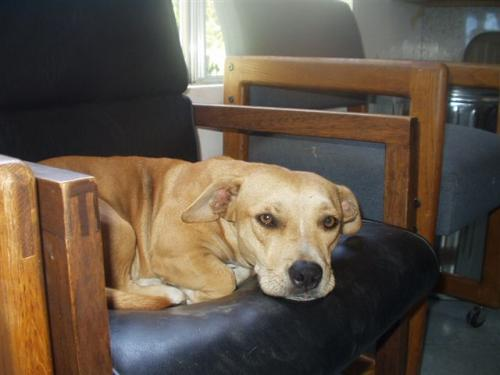

In [6]:
#@title **Visualizar Dataset Train/Dogs** { run: "auto" }
idx = 0 #@param {type:"slider", min:0, max:999, step:1}
train_dogs_dir_filenames = [os.path.join(train_dogs_dir, fname) for fname in os.listdir(train_dogs_dir)]
display(Image(train_dogs_dir_filenames[idx]))

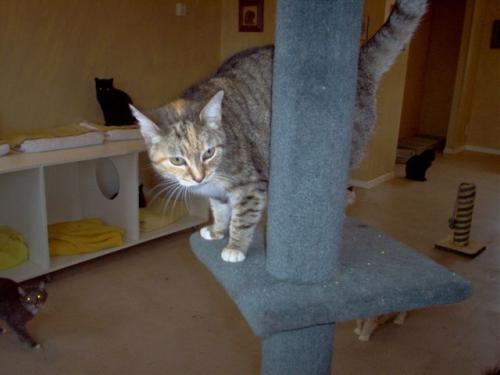

In [7]:
#@title **Visualizar Dataset Train/Cats** { run: "auto" }
idx = 0 #@param {type:"slider", min:0, max:999, step:1}
train_cats_dir_filenames = [os.path.join(train_cats_dir, fname) for fname in os.listdir(train_cats_dir)]
display(Image(train_cats_dir_filenames[idx]))

In [8]:
#@title **Preprocesamiento de Datos y Configuración de Generadores**

# Preprocesamiento de Datos y Configuración de Generadores

# Generador de datos de entrenamiento con normalización de imágenes
train_datagen = ImageDataGenerator(rescale=1./255)

# Generador de datos de validación con normalización de imágenes
validation_datagen = ImageDataGenerator(rescale=1./255)

# Generador de datos de prueba con normalización de imágenes
test_datagen = ImageDataGenerator(rescale=1./255)

# Configuración del generador para el conjunto de entrenamiento
train_generator = train_datagen.flow_from_directory(
        train_dir,             # Directorio de las imágenes de entrenamiento
        target_size=(150, 150),# Redimensiona las imágenes a 150x150 píxeles
        batch_size=20,         # Tamaño del lote
        class_mode='binary')   # Modo de clasificación binaria (perros vs gatos)

# Configuración del generador para el conjunto de validación
validation_generator = validation_datagen.flow_from_directory(
        test_dir,              # Directorio de las imágenes de prueba
        target_size=(150, 150),# Redimensiona las imágenes a 150x150 píxeles
        batch_size=32,         # Tamaño del lote
        class_mode='binary')   # Modo de clasificación binaria (perros vs gatos)


Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


### **Entrenamiento**


In [9]:
# Entrenamiento del modelo

history = model.fit(
    train_generator,           # Generador de datos de entrenamiento
    steps_per_epoch=100,       # Número de pasos de entrenamiento por época
    epochs=20,                 # Número total de épocas
    validation_data=validation_generator, # Generador de datos de validación
    validation_steps=50,       # Número de pasos de validación por época
    verbose=1)                 # Modo de verbosidad (1 muestra una barra de progreso por época)

Epoch 1/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 29s 103ms/step - accuracy: 0.4885 - loss: 0.7004 - val_accuracy: 0.5350 - val_loss: 0.6921
Epoch 2/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5350 - val_loss: 0.6921
Epoch 3/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step - accuracy: 0.5073 - loss: 0.6938 - val_accuracy: 0.5010 - val_loss: 0.6935
Epoch 4/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5010 - val_loss: 0.6935
Epoch 5/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 8s 61ms/step - accuracy: 0.5006 - loss: 0.6936 - val_accuracy: 0.5140 - val_loss: 0.6921
Epoch 6/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.0000e+00 - loss: 0.0000e+00 - val_accuracy: 0.5140 - val_loss: 0.6921
Epoch 7/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step - accuracy: 0.4971 - loss: 0.6929 - val_accuracy: 0.5270 - val_loss: 0.6916
Epoch 8/20
100/100 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.0000

In [10]:
# Guardar el modelo entrenado en un archivo
model.save('model.keras')

# Guardar el historial de entrenamiento en un archivo binario
save_history(history, 'history.bin')

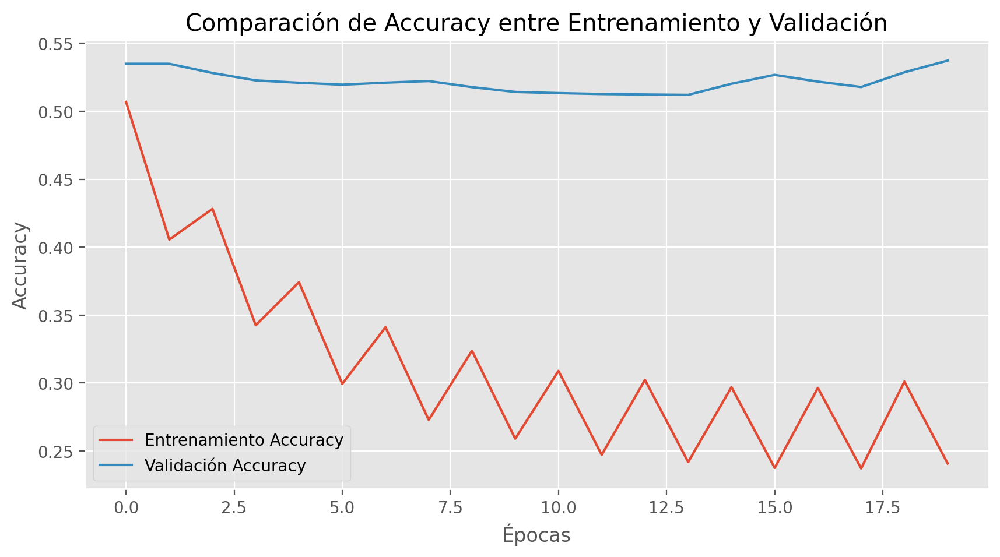

In [11]:
# Cargar el historial de entrenamiento desde un archivo binario
history = load_history('history.bin')

# Graficar la comparación de accuracy entre entrenamiento y validación
plot_compare(history)

### **Aumento de datos**

In [12]:
# Definición de un modelo CNN con aumento de datos

model_aug = Sequential()

# Primera capa de convolución seguida de MaxPooling
model_aug.add(Conv2D(32, (3, 3), activation='relu', padding='same', name='conv_1',
                 input_shape=(150, 150, 3)))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_1'))

# Segunda capa de convolución seguida de MaxPooling
model_aug.add(Conv2D(64, (3, 3), activation='relu', padding='same', name='conv_2'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_2'))

# Tercera capa de convolución seguida de MaxPooling
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_3'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_3'))

# Cuarta capa de convolución seguida de MaxPooling
model_aug.add(Conv2D(128, (3, 3), activation='relu', padding='same', name='conv_4'))
model_aug.add(MaxPooling2D((2, 2), name='maxpool_4'))

# Aplanamiento de los datos antes de pasar a las capas densas
model_aug.add(Flatten())

# Añadir Dropout para reducir el overfitting
model_aug.add(Dropout(0.5))

# Primera capa densa con 512 unidades
model_aug.add(Dense(512, activation='relu', name='dense_1'))

# Segunda capa densa con 256 unidades
model_aug.add(Dense(256, activation='relu', name='dense_2'))

# Capa de salida con activación sigmoide para clasificar entre dos clases
model_aug.add(Dense(1, activation='sigmoid', name='output'))

In [13]:
# Compilación del modelo con el optimizador Adam, usando la función de pérdida de entropía cruzada binaria
# y la métrica de precisión para evaluar el rendimiento del modelo.
model_aug.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [14]:
# Configuración del generador de datos de entrenamiento con aumento de datos
# Se rescalan los valores de los píxeles y se aplican transformaciones aleatorias
# como rotación, desplazamiento, corte, zoom y volteo horizontal para aumentar la variedad de las imágenes de entrenamiento.
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
)

# Configuración del generador de datos de validación
# Solo se reescala el valor de los píxeles sin aplicar aumentos de datos, ya que los datos de validación deben permanecer consistentes.
test_datagen = ImageDataGenerator(rescale=1./255)

# Creación del generador para el conjunto de entrenamiento, que produce lotes de imágenes aumentadas.
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(150, 150),  # Tamaño al que se ajustan las imágenes
        batch_size=32,  # Número de imágenes por lote
        class_mode='binary')  # Tipo de clasificación (binaria)

# Creación del generador para el conjunto de validación, sin aumento de datos.
validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(150, 150),
        batch_size=32,
        class_mode='binary')

# Entrenamiento del modelo con los datos aumentados durante 60 épocas, evaluando el rendimiento con los datos de validación en cada época.
# early_stop se puede descomentar para detener el entrenamiento si el rendimiento en validación deja de mejorar.
history_aug = model_aug.fit(train_generator, steps_per_epoch=100, epochs=60,
                            validation_data=validation_generator, validation_steps=50, verbose=0)

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [15]:
# Guardar el modelo entrenado con aumentos de datos en un archivo con formato HDF5.
# Esto permite reusar el modelo en el futuro sin necesidad de reentrenarlo.
model_aug.save('model_aug.h5')

# Guardar el historial del entrenamiento del modelo en un archivo binario.
# Esto permite revisar el progreso del entrenamiento más adelante o realizar análisis de las métricas de entrenamiento.
save_history(history_aug, 'history_aug.bin')

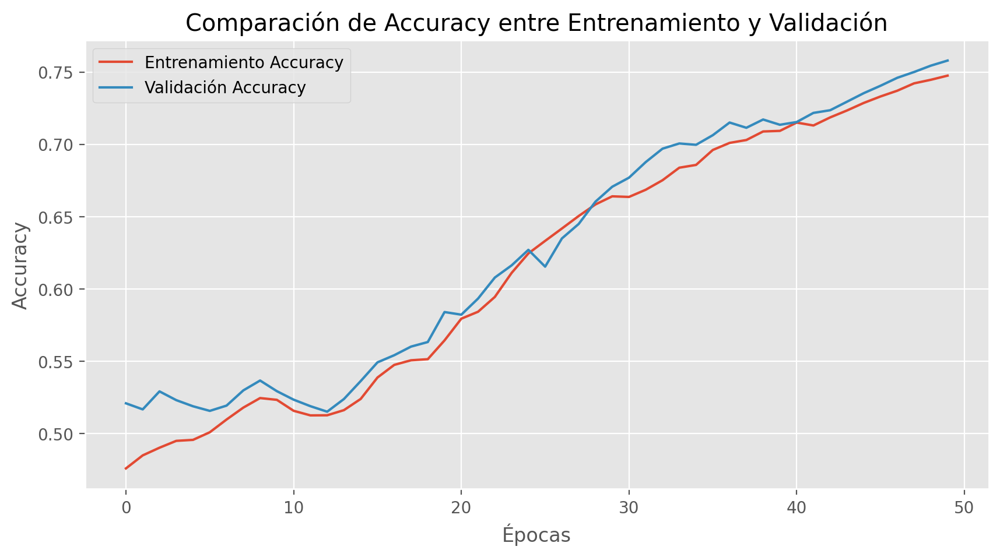

In [16]:
# Cargar el historial de entrenamiento del modelo con aumentos de datos desde el archivo binario.
# Esto permite recuperar las métricas de entrenamiento y validación para análisis posteriores.
history_aug = load_history('history_aug.bin')

# Graficar la comparación de la precisión de entrenamiento y validación usando los datos del historial cargado.
# El parámetro 'steps' se establece en 50 para mostrar las métricas de las primeras 50 épocas.
plot_compare(history_aug, steps=50)

### **Visualización de Mapas de Características**

In [17]:
img_path = '/content/dogvscat_small/train/cats/620.jpg'
# img_path = '/content/dogvscat_small/train/dogs/620

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


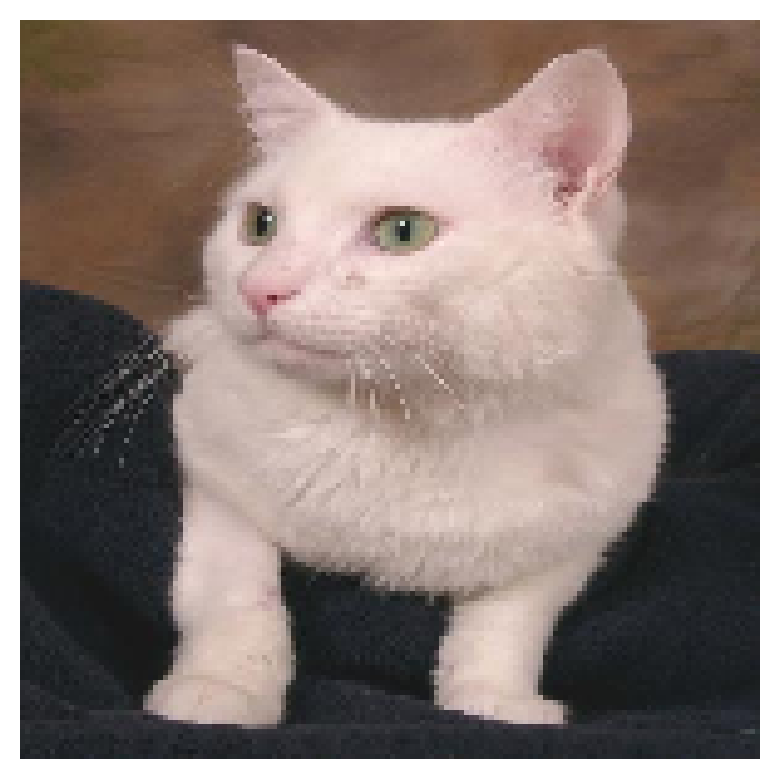

In [18]:
plt.imshow(img_tensor[0])
plt.axis('off')
plt.show()

In [19]:
# Cargar el modelo VGG16 preentrenado en el conjunto de datos ImageNet.
# 'weights='imagenet'' indica que se utilizarán los pesos preentrenados,
# y 'include_top=False' significa que no se incluirá la capa de clasificación final.
# Esto permite usar VGG16 como un extractor de características para tareas de transferencia de aprendizaje.
vgg = VGG16(weights='imagenet', include_top=False)

# Mostrar un resumen de la arquitectura del modelo VGG16.
# Esto proporciona información sobre las capas, el tipo de cada capa, la forma de las salidas y el número de parámetros.
vgg.summary()

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, None, None, 3)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, None, None, 64)      │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, None, None, 64)      │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, None, None, 64)      │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, None, None, 128)     │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, None, None, 128)     │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, None, None, 128)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, None, None, 256)     │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, None, None, 256)     │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, None, None, 256)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, None, None, 512)     │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, None, None, 512)     │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, None, None, 512)     │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


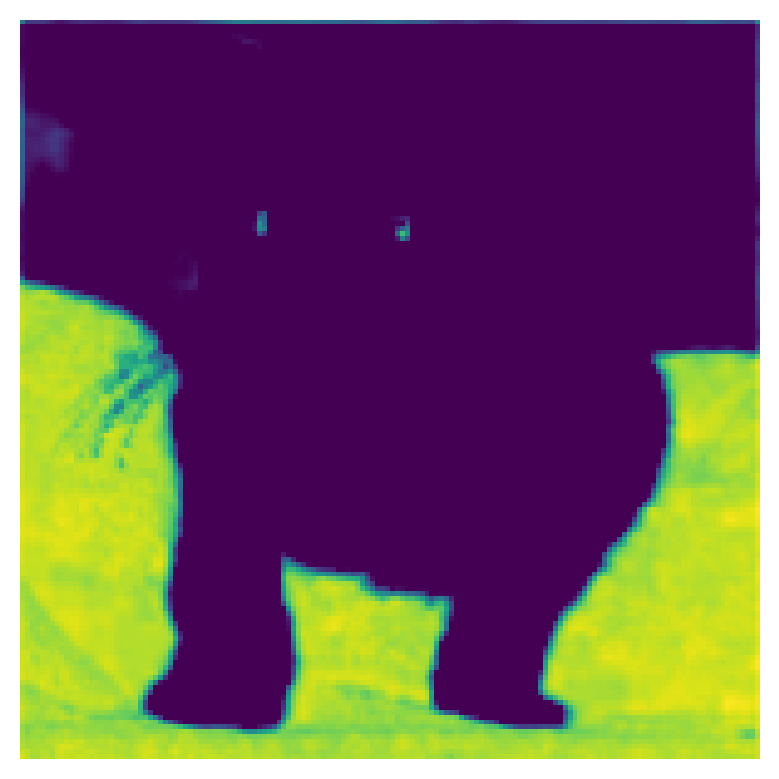

In [20]:
# Extraer las salidas de las capas de convolución que contienen 'conv1' en su nombre.
# Esto selecciona las activaciones de las 8 capas superiores de la red VGG16.
layer_outputs = [layer.output for layer in vgg.layers if 'conv1' in layer.name]

# Crear un nuevo modelo que toma las entradas de VGG16 y produce las salidas de las capas seleccionadas.
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)

# Generar las activaciones intermedias para una imagen de entrada usando el modelo de activación.
# 'img_tensor' es el tensor de imagen preprocesado.
intermediate_activations = activation_model.predict(img_tensor)

# Obtener las activaciones de la primera capa convolucional.
first_layer_activation = intermediate_activations[0]

# Visualizar la activación del canal 19 de la primera capa convolucional.
# Esto muestra cómo la red detecta características específicas en la imagen.
plt.imshow(first_layer_activation[0, :, :, 19], cmap='viridis')
plt.axis('off')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 318ms/step


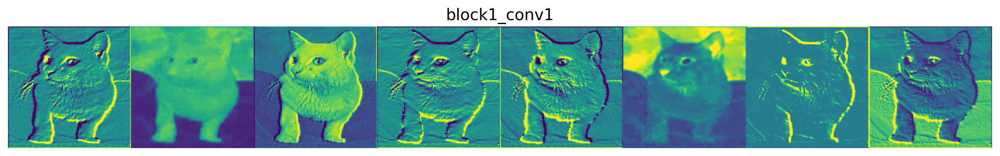

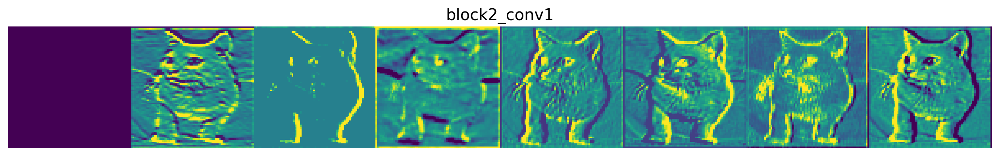

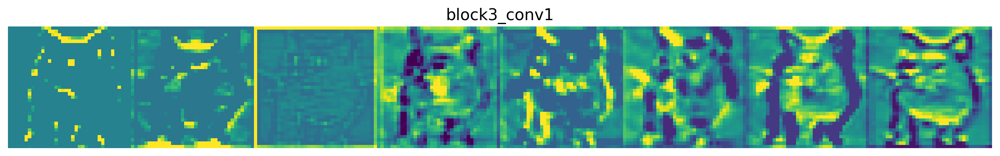

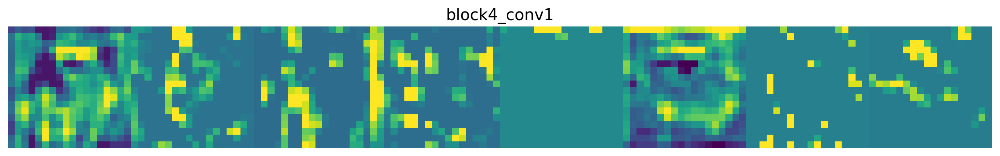

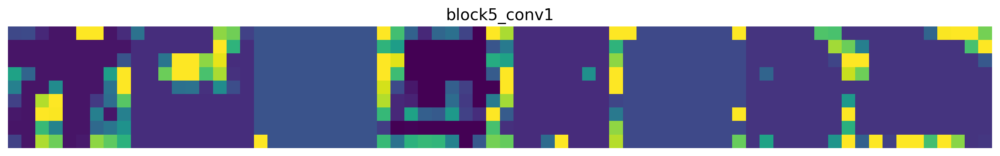

In [21]:
# Definir los nombres de las capas que queremos visualizar.
layer_names = ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']

# Obtener las salidas de las capas especificadas.
layer_outputs = [layer.output for layer in vgg.layers if layer.name in layer_names]

# Crear un nuevo modelo que toma las entradas de VGG16 y produce las salidas de las capas seleccionadas.
activation_model = Model(inputs=vgg.input, outputs=layer_outputs)

# Generar las activaciones intermedias para una imagen de entrada usando el modelo de activación.
intermediate_activations = activation_model.predict(img_tensor)

# Número de imágenes por fila en la cuadrícula de visualización.
images_per_row = 8
# Número máximo de imágenes para mostrar en cada capa.
max_images = 8

# Ahora vamos a mostrar nuestros mapas de características.
for layer_name, layer_activation in zip(layer_names, intermediate_activations):
    # Obtener el número de características en el mapa de características.
    n_features = layer_activation.shape[-1]
    # Limitar el número de características a 'max_images'.
    n_features = min(n_features, max_images)

    # Obtener el tamaño del mapa de características.
    size = layer_activation.shape[1]

    # Crear una cuadrícula para colocar los canales de activación.
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # Colocar cada filtro en la cuadrícula.
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            # Postprocesar la imagen para mejorar su visualización.
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Mostrar la cuadrícula de características para la capa actual.
    scale = 2. / size
    plt.figure(figsize=(scale * display_grid.shape[1], scale * display_grid.shape[0]))
    plt.axis('off')
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

# Mostrar todas las cuadrículas generadas.
plt.show()

### **Visualización de Capas Densas**

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 29s 0us/step


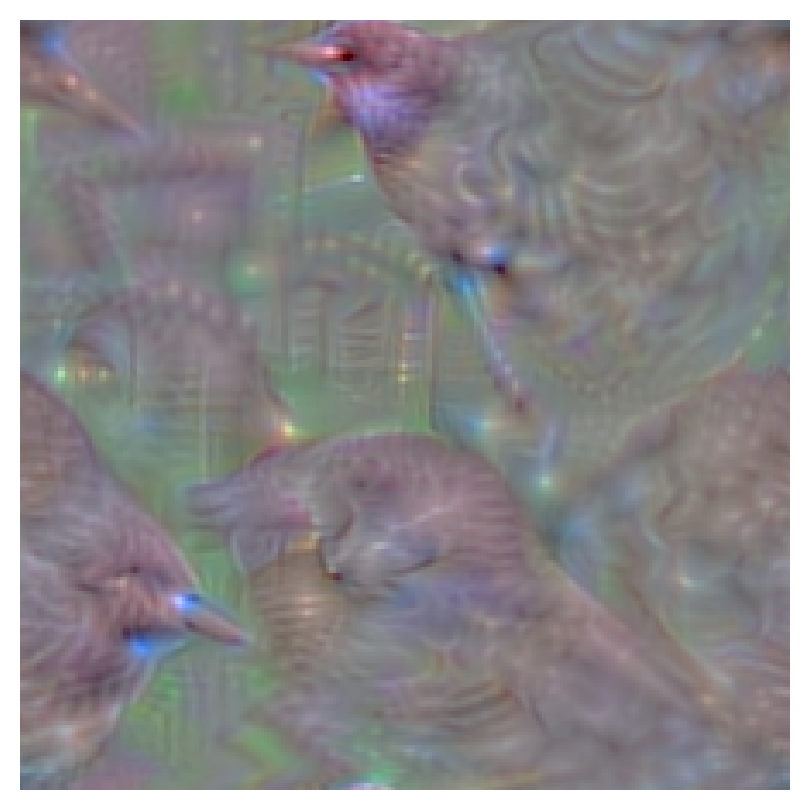

In [22]:
# Construya la red VGG16 con pesos de ImageNet
model = VGG16(weights='imagenet', include_top=True)

# Cree un modificador de modelo para reemplazar la activación softmax con lineal
modifier = ReplaceToLinear()

# Crear la instancia de Maximización de Activación
activation_maximization = ActivationMaximization(model, model_modifier=modifier)

# Realizar maximización de activación
# 20 es el índice de clase para 'ouzel'
img = activation_maximization(CategoricalScore(20))

# Elimine la dimensión adicional y asegúrese de que la imagen tenga el formato correcto
img = np.squeeze(img)  # Eliminar entradas unidimensionales de la forma
img = np.clip(img, 0, 255).astype('uint8')  # Asegúrese de que los valores estén dentro del rango [0, 255]

# Graficar la imagen
plot_image(img)

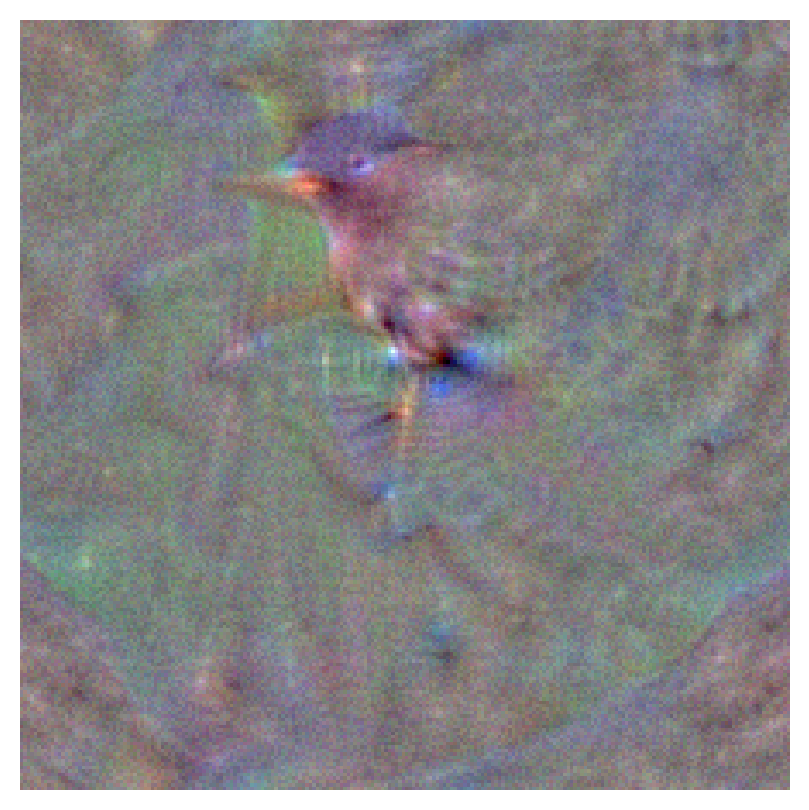

In [23]:
# Construir la red VGG16 con pesos preentrenados en ImageNet
model = VGG16(weights='imagenet', include_top=True)

# Crear un modificador de modelo para reemplazar la activación softmax con lineal
modifier = ReplaceToLinear()

# Crear una instancia de Maximización de Activación
activation_maximization = ActivationMaximization(model, model_modifier=modifier)

# Realizar la maximización de activación
# Nota: Jitter y max_iter podrían necesitar un manejo diferente
score = CategoricalScore(20)  # Definir la puntuación categórica para la maximización
img = activation_maximization(score)  # Generar la imagen que maximiza la puntuación

# Aplicar Jitter manualmente si es necesario
jitter_amount = 16
img = Jitter(jitter_amount)(img)  # Aplicar jitter a la imagen

# Eliminar la dimensión adicional y asegurarse de que la imagen esté en el formato correcto
img = np.squeeze(img)  # Eliminar entradas de una sola dimensión del tamaño de la imagen
img = np.clip(img, 0, 255).astype('uint8')  # Asegurarse de que los valores estén en el rango [0, 255]

# Mostrar la imagen resultante
plot_image(img)

Capa 1 (block1_conv1): 64 filtros
Capa 2 (block1_conv2): 64 filtros
Capa 4 (block2_conv1): 128 filtros
Capa 5 (block2_conv2): 128 filtros
Capa 7 (block3_conv1): 256 filtros
Capa 8 (block3_conv2): 256 filtros
Capa 9 (block3_conv3): 256 filtros
Capa 11 (block4_conv1): 512 filtros
Capa 12 (block4_conv2): 512 filtros
Capa 13 (block4_conv3): 512 filtros
Capa 15 (block5_conv1): 512 filtros
Capa 16 (block5_conv2): 512 filtros
Capa 17 (block5_conv3): 512 filtros


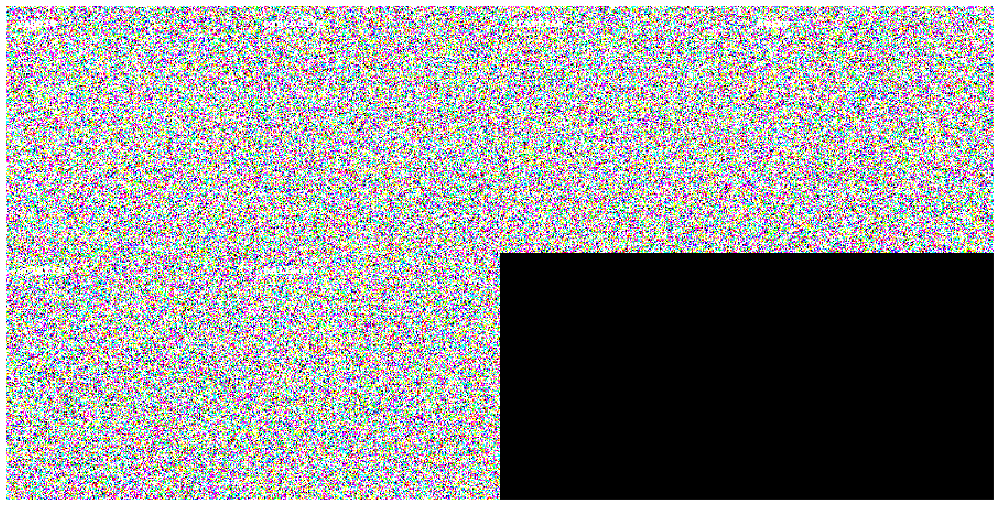

In [24]:
from PIL import Image, ImageDraw, ImageFont

# Cargar un modelo preentrenado VGG16 sin la capa superior (clasificación)
model = VGG16(weights='imagenet', include_top=False)

# Imprimir las capas y la cantidad de filtros en cada capa convolucional
for idx, layer in enumerate(model.layers):
    if 'conv' in layer.name:
        output_shape = layer.output.shape
        print(f"Capa {idx} ({layer.name}): {output_shape[-1]} filtros")

# Especificar el índice de la capa que quieres visualizar
layer_idx = 15  # Índice de ejemplo, ajusta según tu salida

# Definir los códigos de activación que deseas visualizar
codes = '''
rabbit 330
crocodile 49
starfish 327
husky 248
goldfish 1
balloon 417
'''

# Listas para almacenar imágenes iniciales y sus nombres
initial = []
images = []
tuples = []

# Función para crear una imagen compuesta a partir de varias imágenes (versión con PIL)
def stitch_images(images, cols=4):
    if not images:
        return None

    img_width, img_height = images[0].size
    rows = (len(images) + cols - 1) // cols
    stitched_image = Image.new('RGB', (cols * img_width, rows * img_height))

    for idx, img in enumerate(images):
        row = idx // cols
        col = idx % cols
        stitched_image.paste(img, (col * img_width, row * img_height))

    return stitched_image

# Procesar cada línea del texto de códigos
for line in codes.split('\n'):
    if not line:
        continue
    name, idx = line.rsplit(' ', 1)
    idx = int(idx)
    # Verificar si el índice está dentro del rango válido para la capa
    num_filters = model.layers[layer_idx].output.shape[-1]
    if 0 <= idx < num_filters:
        img = visualize_activation(model, layer_idx, filter_indices=idx,
                                   tv_weight=0., max_iter=300, input_modifiers=[Jitter(16)])
        initial.append(img)
        tuples.append((name, idx))
    else:
        print(f"Saltando {name} con índice de filtro inválido {idx}")

i = 0
for name, idx in tuples:
    # Asegurarse de que el seed_input tenga la forma correcta (224, 224, 3)
    seed_input = np.array(initial[i]).astype(np.float32)
    # Añadir dimensión de lote
    seed_input = np.expand_dims(seed_input, axis=0)  # Forma (1, 224, 224, 3)
    img = visualize_activation(model, layer_idx, filter_indices=idx,
                               seed_input=seed_input, max_iter=300, input_modifiers=[Jitter(16)])
    img = draw_text(img, name)  # Añadir texto a la imagen
    i += 1
    images.append(img)

# Unir todas las imágenes en una sola cuadrícula
stitched = stitch_images(images, cols=4)
plt.figure(figsize=(20, 20))
plt.axis('off')
plt.imshow(stitched)
plt.show()

### **Visualización de filtros de Convnet**

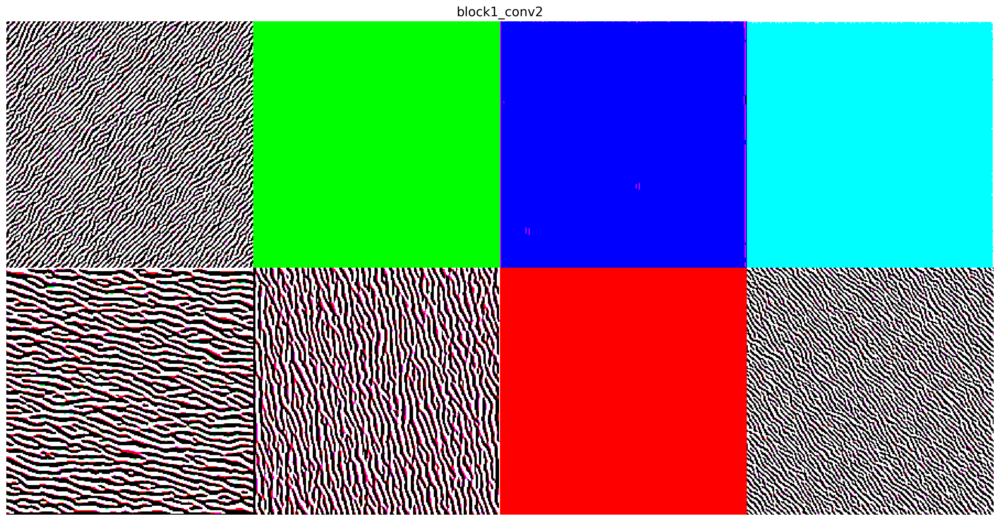

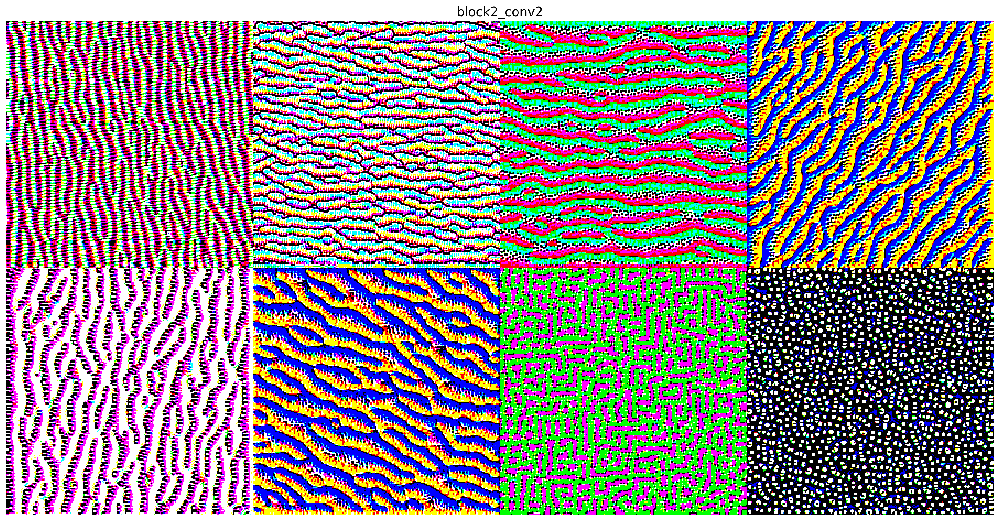

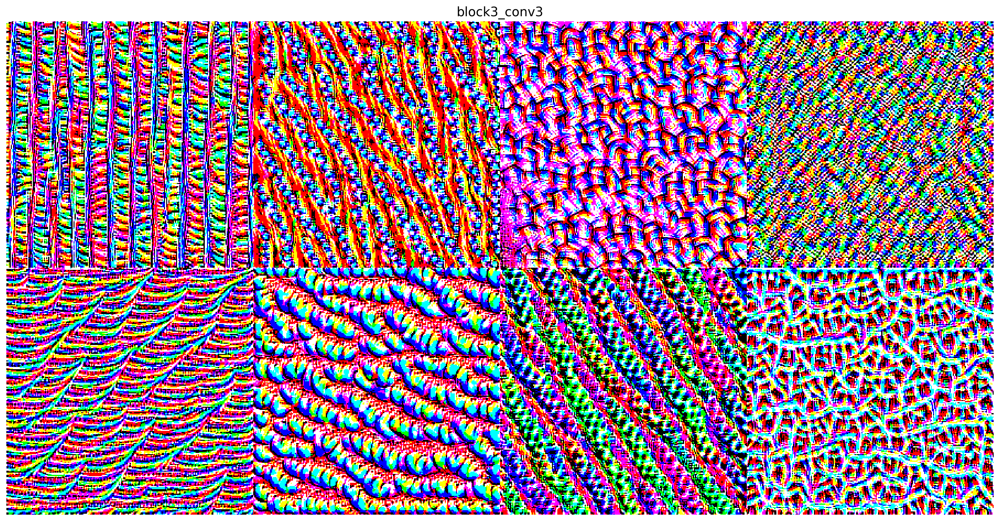

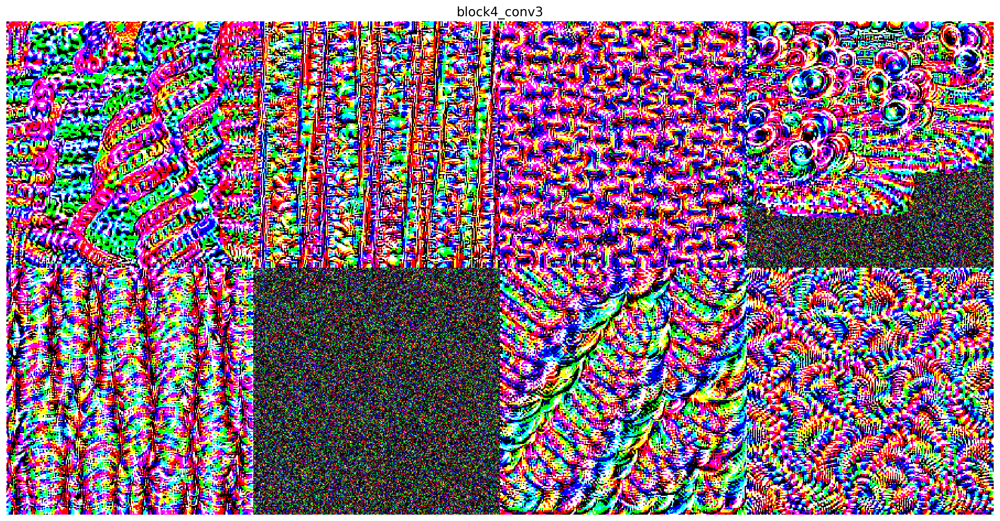

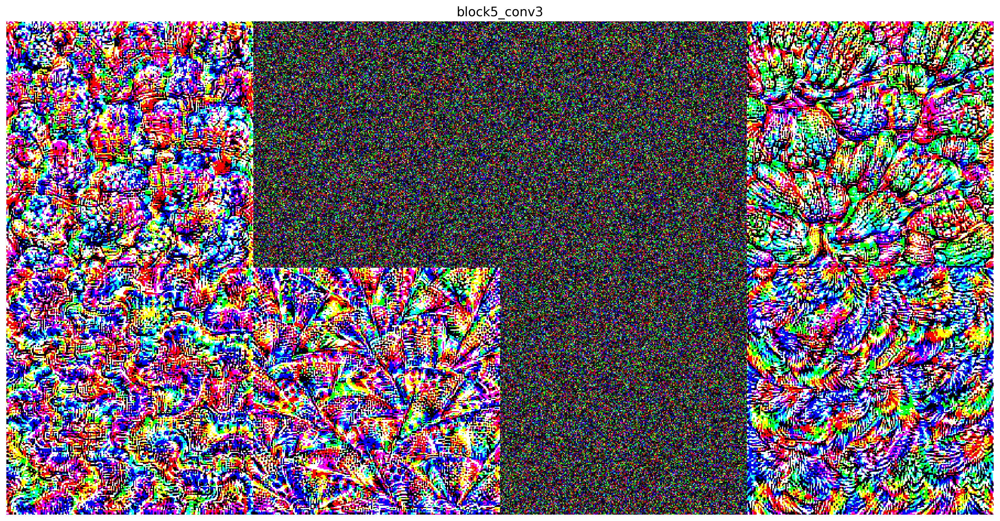

In [25]:
# Cargar un modelo preentrenado VGG16 sin la capa superior (clasificación)
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Índices de filtros de ejemplo
max_filters = 40  # Número máximo de filtros a visualizar
selected_indices = []  # Lista para almacenar los índices de filtros seleccionados
vis_images = [[], [], [], [], []]  # Lista para almacenar imágenes visualizadas por capa
i = 0  # Índice para las capas
selected_filters = [
    [0, 3, 11, 25, 26, 33, 42, 62],  # Filtros seleccionados para la primera capa
    [8, 21, 23, 38, 39, 45, 50, 79],  # Filtros seleccionados para la segunda capa
    [40, 48, 52, 54, 81, 107, 224, 226],  # Filtros seleccionados para la tercera capa
    [58, 79, 86, 216, 307, 426, 497, 509],  # Filtros seleccionados para la cuarta capa
    [2, 7, 41, 84, 103, 306, 461, 487]  # Filtros seleccionados para la quinta capa
]

# Iterar sobre cada capa especificada
for layer_name in ['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']:
    layer_idx = find_layer_idx(model, layer_name)  # Encontrar el índice de la capa

    # Visualizar todos los filtros en esta capa.
    if selected_filters:
        filters = selected_filters[i]  # Usar filtros seleccionados predefinidos
    else:
        filters = sorted(np.random.permutation(get_num_filters(model.layers[layer_idx]))[:max_filters])
        # Si no se especifican filtros, seleccionar aleatoriamente
    selected_indices.append(filters)  # Almacenar los índices de filtros seleccionados

    # Generar imagen de entrada para cada filtro
    for idx in filters:
        img = visualize_activation(model, layer_idx, filter_indices=idx, tv_weight=0.,
                                   input_modifiers=[Jitter(0.05)], max_iter=300)
        vis_images[i].append(img)  # Añadir imagen a la lista de imágenes visualizadas

    # Generar una cuadrícula de imágenes con 4 columnas para obtener 2 filas
    stitched = stitch_images(vis_images[i], cols=4)
    plt.figure(figsize=(20, 30))
    plt.title(layer_name)  # Título de la figura con el nombre de la capa
    plt.axis('off')
    plt.imshow(stitched)  # Mostrar la cuadrícula de imágenes
    plt.show()
    i += 1  # Incrementar el índice para la próxima capa

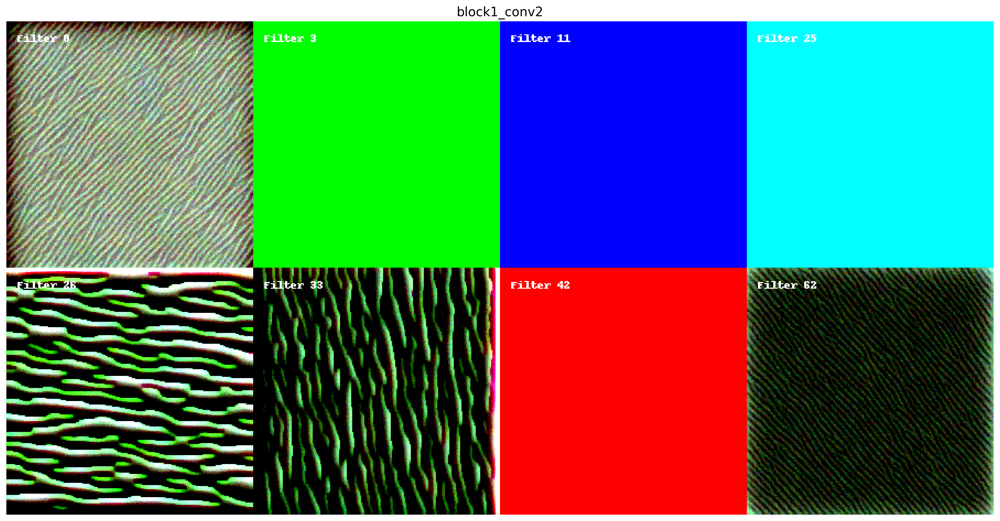

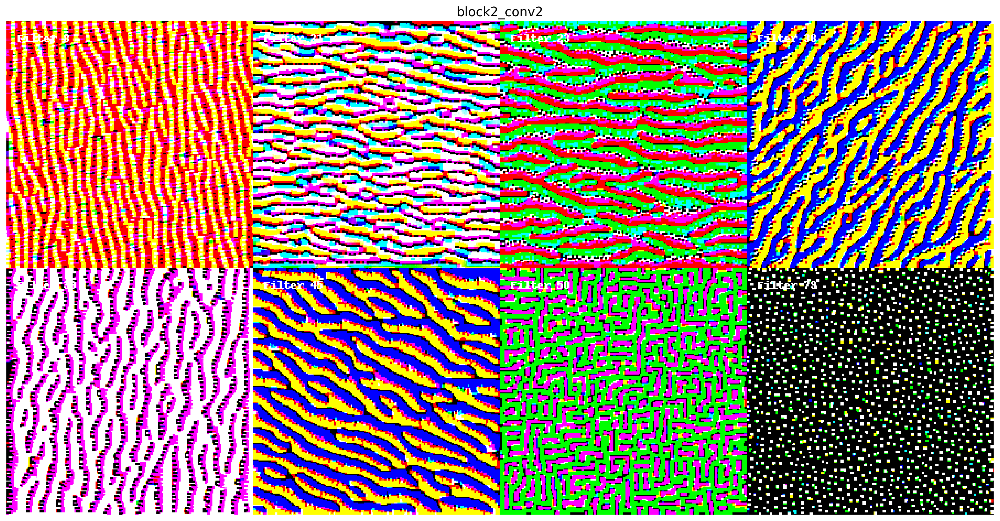

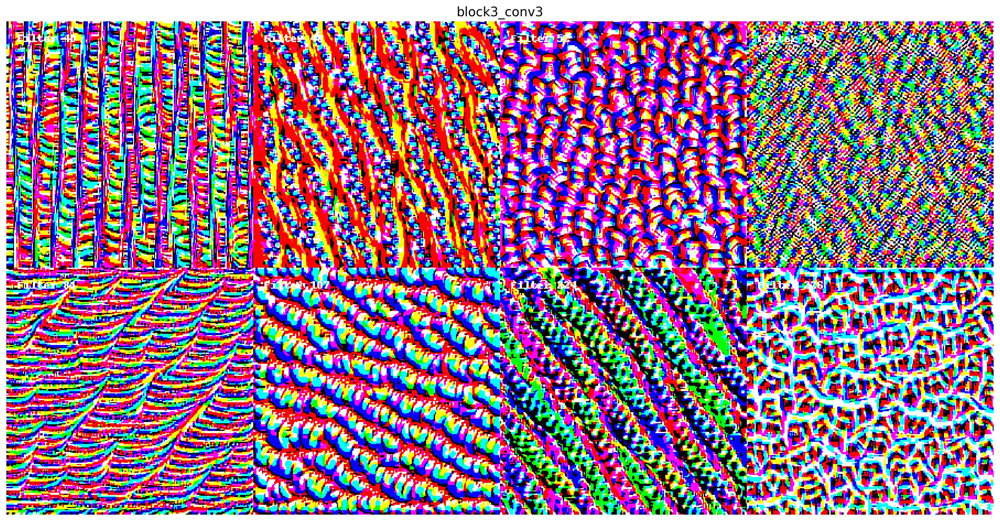

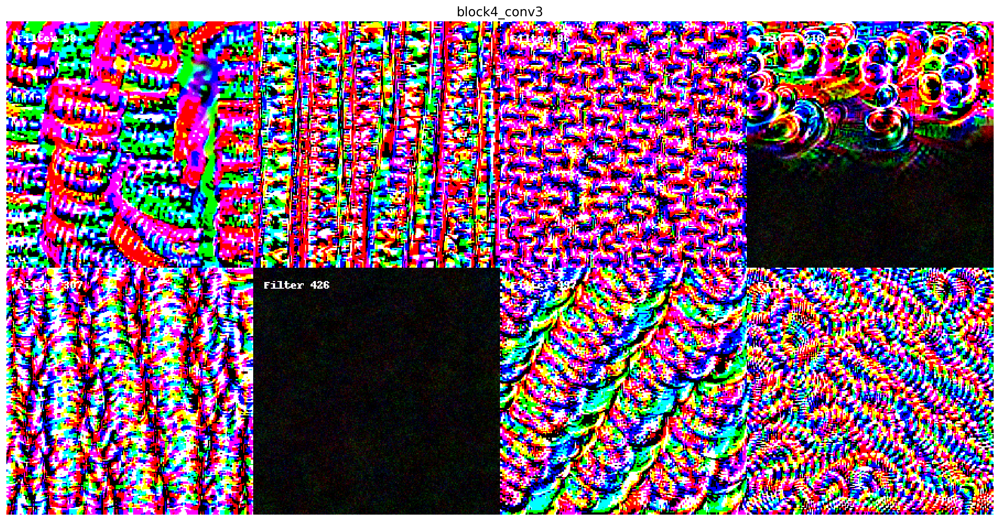

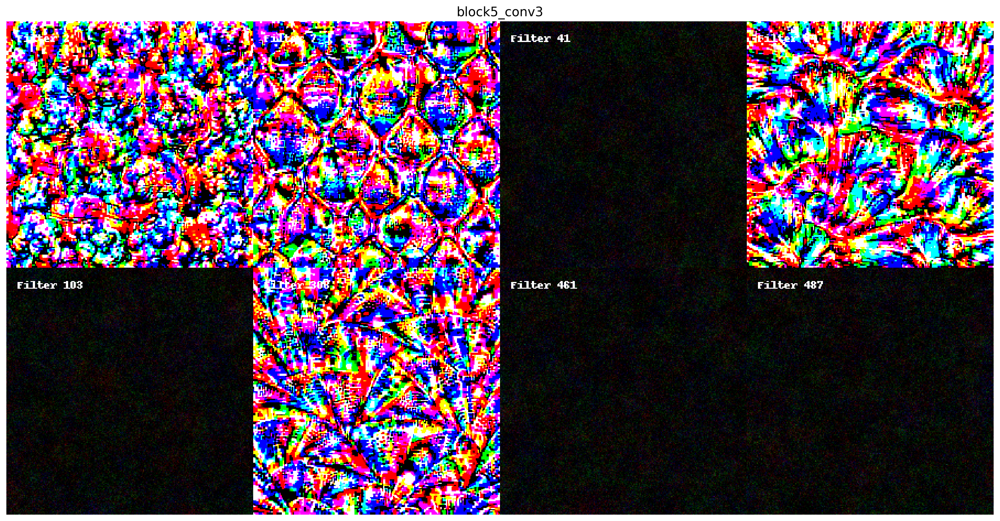

In [26]:
# Cargar un modelo preentrenado VGG16 sin la capa superior (clasificación)
model = tf.keras.applications.VGG16(weights='imagenet', include_top=False)

# Índices de filtros de ejemplo para cada capa
max_filters = 40  # Número máximo de filtros a visualizar
selected_indices = [
    [0, 3, 11, 25, 26, 33, 42, 62],  # Filtros seleccionados para la primera capa
    [8, 21, 23, 38, 39, 45, 50, 79],  # Filtros seleccionados para la segunda capa
    [40, 48, 52, 54, 81, 107, 224, 226],  # Filtros seleccionados para la tercera capa
    [58, 79, 86, 216, 307, 426, 497, 509],  # Filtros seleccionados para la cuarta capa
    [2, 7, 41, 84, 103, 306, 461, 487]  # Filtros seleccionados para la quinta capa
]

# Listas para almacenar imágenes visualizadas por capa
vis_images = [[], [], [], [], []]
new_vis_images = [[], [], [], [], []]

# Generar imágenes para cada capa y filtro
for i, layer_name in enumerate(['block1_conv2', 'block2_conv2', 'block3_conv3', 'block4_conv3', 'block5_conv3']):
    layer_idx = find_layer_idx(model, layer_name)  # Encontrar el índice de la capa

    # Generar una imagen inicial aleatoria si vis_images[i] está vacío
    if not vis_images[i]:
        vis_images[i] = [np.random.uniform(-0.5, 0.5, (224, 224, 3)).astype(np.float32) for _ in selected_indices[i]]

    # Generar imagen de entrada para cada filtro
    for j, idx in enumerate(selected_indices[i]):
        img = visualize_activation(model, layer_idx, filter_indices=idx,
                                   seed_input=vis_images[i][j], input_modifiers=[Jitter(0.05)])
        img = draw_text(img, 'Filter {}'.format(idx))  # Añadir texto a la imagen
        new_vis_images[i].append(img)  # Añadir imagen a la lista de nuevas imágenes visualizadas

    # Generar una cuadrícula de imágenes con 4 columnas
    stitched = stitch_images(new_vis_images[i], cols=4)
    plt.figure(figsize=(20, 30))
    plt.title(layer_name)  # Título de la figura con el nombre de la capa
    plt.axis('off')
    plt.imshow(stitched)  # Mostrar la cuadrícula de imágenes
    plt.show()

### **Predicciones**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 247ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step


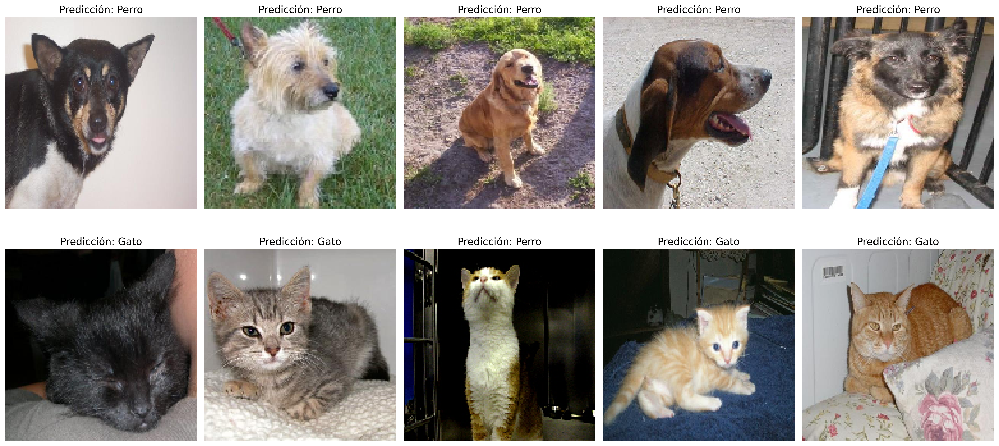

In [46]:
#@title **Dogs vs Cats**

import random
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model

# Cargar el modelo
model = load_model('model_aug.h5')  # Reemplaza 'model_aug.h5' con el nombre de tu modelo

# Directorio base de las imágenes
base_dir = '/content/dogvscat_small/test'

# Directorios de perros y gatos
dog_dir = os.path.join(base_dir, 'dogs')
cat_dir = os.path.join(base_dir, 'cats')

# Crear una figura para mostrar las imágenes y predicciones
fig, axes = plt.subplots(2, 5, figsize=(20, 10))

# Función para predecir y mostrar imágenes
def predict_and_display(img_path, ax):
    # Cargar y preprocesar la imagen
    img = image.load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    # Realizar la predicción
    prediction = model.predict(img_tensor)
    predicted_class = 'Perro' if prediction[0][0] > 0.5 else 'Gato'

    # Mostrar la imagen y la predicción
    ax.imshow(img_tensor[0])
    ax.axis('off')
    ax.set_title(f'Predicción: {predicted_class}')

# Mostrar 5 imágenes aleatorias de perros
for i in range(5):
    img_path = os.path.join(dog_dir, random.choice(os.listdir(dog_dir)))
    predict_and_display(img_path, axes[0, i])

# Mostrar 5 imágenes aleatorias de gatos
for i in range(5):
    img_path = os.path.join(cat_dir, random.choice(os.listdir(cat_dir)))
    predict_and_display(img_path, axes[1, i])

# Ajustar el espaciado entre subplots
plt.tight_layout()
plt.show()